In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

plt.rcParams["figure.figsize"] = (10,6)

sns.set_style("whitegrid")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# import warnings
# warnings.filterwarnings("ignore")
# warnings.warn("this will not show")

In [2]:
# !pip install folium 

In [3]:
# from google.colab import drive
# drive.mount('/content/drive')

In [4]:
df = pd.read_csv("kc_house_data.csv")
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503


In [5]:
df.shape

(21597, 21)

# EDA and Visulization

We will be using data from a Kaggle data set:

https://www.kaggle.com/harlfoxem/housesalesprediction

#### Feature Columns
    
* id - Unique ID for each home sold
* date - Date of the home sale
* price - Price of each home sold
* bedrooms - Number of bedrooms
* bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
* sqft_living - Square footage of the apartments interior living space
* sqft_lot - Square footage of the land space
* floors - Number of floors
* waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
* view - An index from 0 to 4 of how good the view of the property was
* condition - An index from 1 to 5 on the condition of the apartment,
* grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
* sqft_above - The square footage of the interior housing space that is above ground level
* sqft_basement - The square footage of the interior housing space that is below ground level
* yr_built - The year the house was initially built
* yr_renovated - The year of the house’s last renovation
* zipcode - What zipcode area the house is in
* lat - Lattitude
* long - Longitude
* sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
* sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  int64  
 9   view           21597 non-null  int64  
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  int64  
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  int64  
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [7]:
df.isna().sum().sum()

0

In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,21597.000,4580474287.771,2876735715.748,1000102.000,2123049175.000,3904930410.000,7308900490.000,9900000190.000
price,21597.000,540296.574,367368.140,78000.000,322000.000,450000.000,645000.000,7700000.000
bedrooms,21597.000,3.373,0.926,1.000,3.000,3.000,4.000,33.000
bathrooms,21597.000,2.116,0.769,0.500,1.750,2.250,2.500,8.000
sqft_living,21597.000,2080.322,918.106,370.000,1430.000,1910.000,2550.000,13540.000
sqft_lot,21597.000,15099.409,41412.637,520.000,5040.000,7618.000,10685.000,1651359.000
floors,21597.000,1.494,0.540,1.000,1.000,1.500,2.000,3.500
waterfront,21597.000,0.008,0.087,0.000,0.000,0.000,0.000,1.000
view,21597.000,0.234,0.766,0.000,0.000,0.000,0.000,4.000
condition,21597.000,3.410,0.651,1.000,3.000,3.000,4.000,5.000


## id Column

In [9]:
df.drop('id' , axis = 1 , inplace = True)

## Outlier Dedection with IQR

In [10]:
def outlier_teller(df,target_col , whisker):
  for col in df.drop(target_col , axis = 1).columns : 
    if df[col].dtype != 'object':
      q3 =  np.percentile(df[col] , 75)
      q1 =  np.percentile(df[col] , 25)

      iqr = q3 - q1
      low_lim = q1 - (whisker*iqr)
      high_lim = q3 + (whisker*iqr)

      outlier_indexes = df[ (df[col] > high_lim) | (df[col] < low_lim) ].index
      print(f'Total outlier {len(outlier_indexes)} in {col} column')

In [11]:
def outlier_deleter(df,target_col , whisker):
  for col in df.drop(target_col , axis = 1).columns : 
    if df[col].dtype != 'object':
      q3 =  np.percentile(df[col] , 75)
      q1 =  np.percentile(df[col] , 25)

      iqr = q3 - q1
      low_lim = q1 - (whisker*iqr)
      high_lim = q3 + (whisker*iqr)

      outlier_indexes = df[ (df[col] > high_lim) | (df[col] < low_lim) ].index
      df.drop(outlier_indexes , axis = 0 , inplace = True)
      print(f'Total outlier {len(outlier_indexes)} in {col} column and dropped.')

In [12]:
outlier_teller(df,'price',3)

Total outlier 24 in bedrooms column
Total outlier 64 in bathrooms column
Total outlier 74 in sqft_living column
Total outlier 1769 in sqft_lot column
Total outlier 0 in floors column
Total outlier 163 in waterfront column
Total outlier 2122 in view column
Total outlier 0 in condition column
Total outlier 103 in grade column
Total outlier 60 in sqft_above column
Total outlier 29 in sqft_basement column
Total outlier 0 in yr_built column
Total outlier 914 in yr_renovated column
Total outlier 0 in zipcode column
Total outlier 0 in lat column
Total outlier 17 in long column
Total outlier 23 in sqft_living15 column
Total outlier 1610 in sqft_lot15 column


In [13]:
# outlier_deleter(df,'price',3) # We dont want to delete most of time...

In [14]:
df.shape

(21597, 20)

## Target Feature

In [15]:
df['price'].value_counts()

450000.000    172
350000.000    172
550000.000    159
500000.000    152
425000.000    150
             ... 
278800.000      1
439888.000      1
354901.000      1
942000.000      1
402101.000      1
Name: price, Length: 3622, dtype: int64

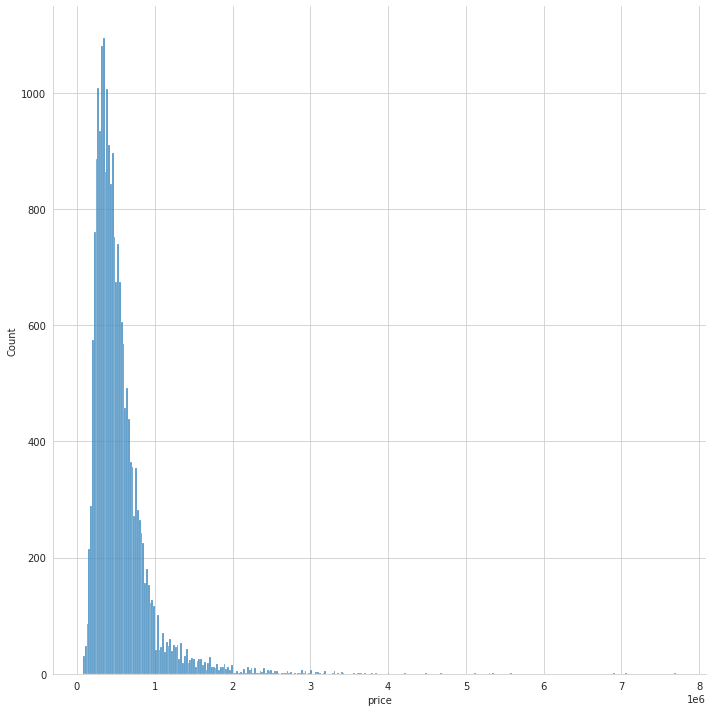

In [16]:
sns.displot(df['price'] , height=10 );

In [17]:
df[df['price'] > 2*10**6].sort_values('price' , ascending=False)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7245,10/13/2014,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,98102,47.630,-122.323,3940,8800
3910,6/11/2014,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,98004,47.650,-122.214,3930,25449
9245,9/19/2014,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,98039,47.630,-122.240,4540,42730
4407,8/4/2014,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,98039,47.629,-122.233,3560,24345
1446,4/13/2015,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,98004,47.623,-122.220,4600,21750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4855,3/24/2015,2050000.000,5,4.000,4690,8208,2.000,0,0,3,9,3040,1650,1926,0,98112,47.632,-122.304,3300,8001
17753,1/15/2015,2050000.000,4,3.250,3580,19989,1.500,1,4,4,7,3480,100,1915,1965,98125,47.709,-122.276,2410,6389
282,5/13/2015,2050000.000,5,3.000,3830,8480,2.000,0,1,5,9,2630,1200,1905,1994,98122,47.617,-122.287,3050,7556
17966,6/17/2014,2030000.000,4,3.750,4100,22798,1.500,0,3,5,11,2540,1560,1934,1979,98040,47.565,-122.210,3880,18730


## Most correlated features

In [18]:
df.corr().drop('price')['price'].sort_values(ascending=False)

sqft_living      0.702
grade            0.668
sqft_above       0.605
sqft_living15    0.585
bathrooms        0.526
view             0.397
sqft_basement    0.324
bedrooms         0.309
lat              0.307
waterfront       0.266
floors           0.257
yr_renovated     0.126
sqft_lot         0.090
sqft_lot15       0.083
yr_built         0.054
condition        0.036
long             0.022
zipcode         -0.053
Name: price, dtype: float64

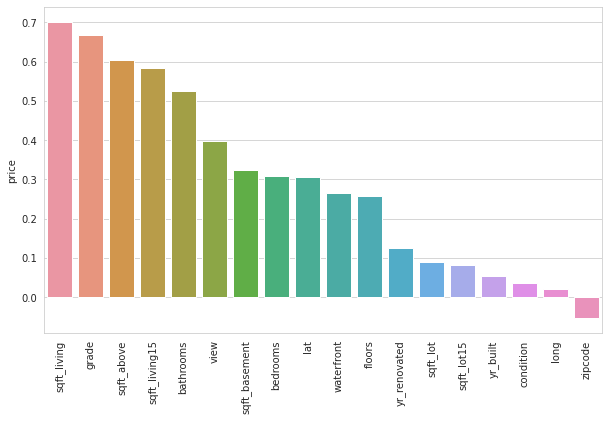

In [19]:
sns.barplot(x = df.corr().drop('price')['price'].sort_values(ascending=False).index , y = df.corr().drop('price')['price'].sort_values(ascending=False))
plt.xticks(rotation = 90);

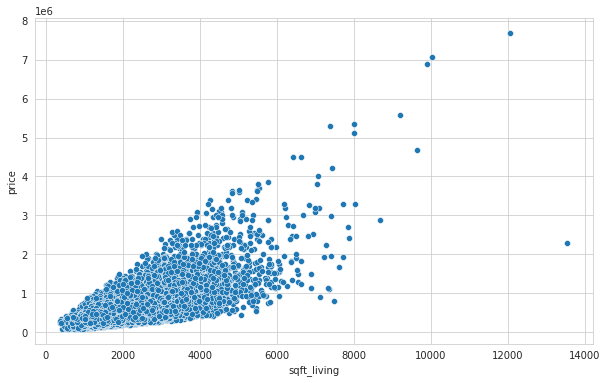

In [20]:
sns.scatterplot(y = 'price' , x = 'sqft_living' , data = df );

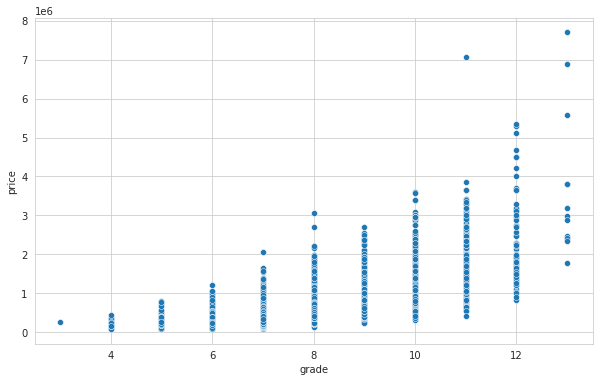

In [21]:
sns.scatterplot(y = 'price' , x = 'grade' , data = df );

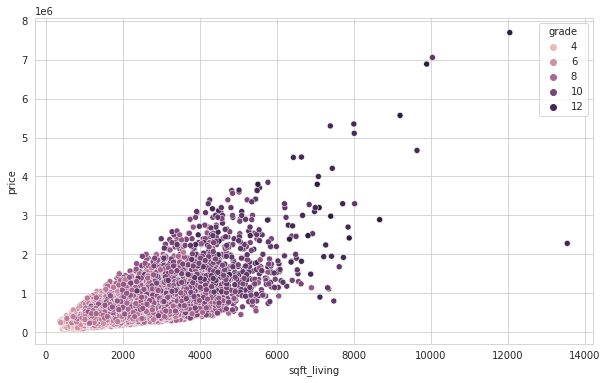

In [22]:
sns.scatterplot(y = 'price' , x = 'sqft_living' , data = df , hue = 'grade' );

### Bedrooms

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


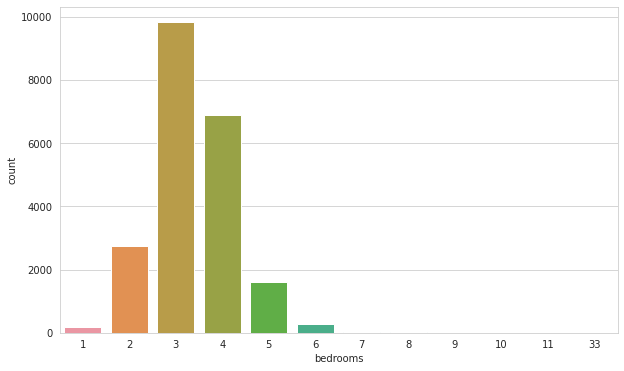

In [23]:
sns.countplot(df['bedrooms']);

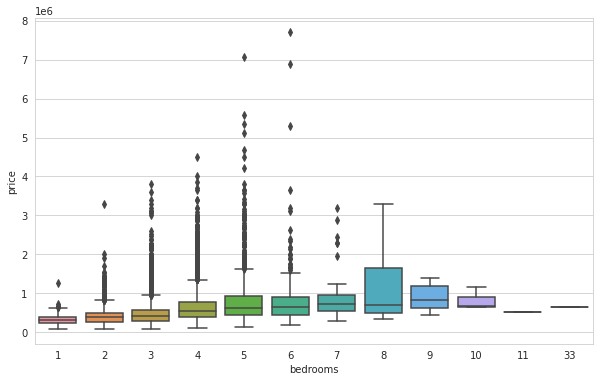

In [24]:
sns.boxplot(x = 'bedrooms', y = 'price', data = df);

In [25]:
df[df["bedrooms"] > 10]

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8748,8/21/2014,520000.000,11,3.000,3000,4960,2.000,0,0,3,7,2400,600,1918,1999,98106,47.556,-122.363,1420,4960
15856,6/25/2014,640000.000,33,1.750,1620,6000,1.000,0,0,5,7,1040,580,1947,0,98103,47.688,-122.331,1330,4700


In [26]:
df = df[df["bedrooms"] != 33] # or df.drop(df[df["bedrooms"] == 33].index , inplace = True)

## Date column

In [27]:
df['date'].dtype

dtype('O')

In [28]:
df['date'] = df['date'].astype('datetime64') # or df['date] = pd.to_datetime(df['date])

In [29]:
df.date

0       2014-10-13
1       2014-12-09
2       2015-02-25
3       2014-12-09
4       2015-02-18
           ...    
21592   2014-05-21
21593   2015-02-23
21594   2014-06-23
21595   2015-01-16
21596   2014-10-15
Name: date, Length: 21596, dtype: datetime64[ns]

In [30]:
year = df.date.apply(lambda x : x.year)
month = df.date.apply(lambda x : x.month)

In [31]:
df['year'] = year   # df['year'] = df['date'].dt.year
df['month'] = month  # df['month'] = df['date'].dt.month

df.drop('date' , axis = 1 , inplace = True)

In [32]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
0,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10
1,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12
2,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2
3,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12
4,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2


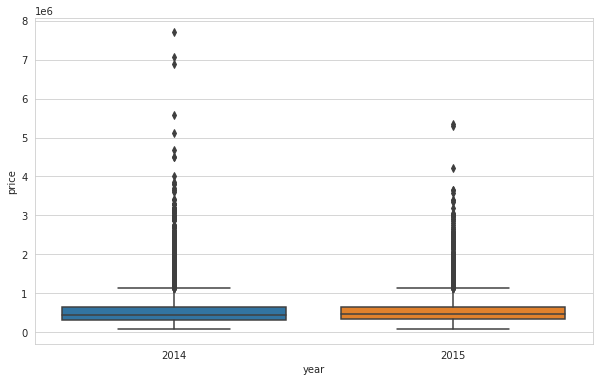

In [33]:
sns.boxplot(x = 'year', y = 'price', data = df);

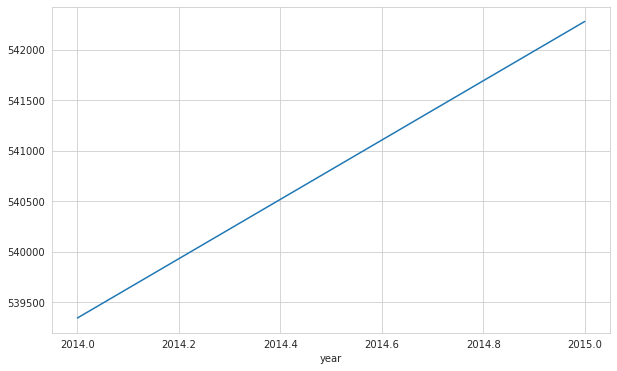

In [34]:
df.groupby('year')['price'].mean().plot();

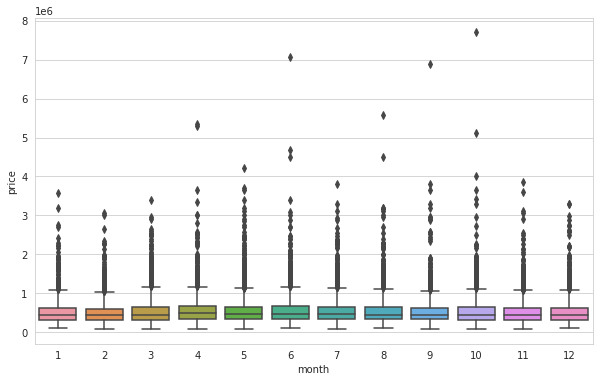

In [35]:
sns.boxplot(x = 'month', y = 'price', data = df);

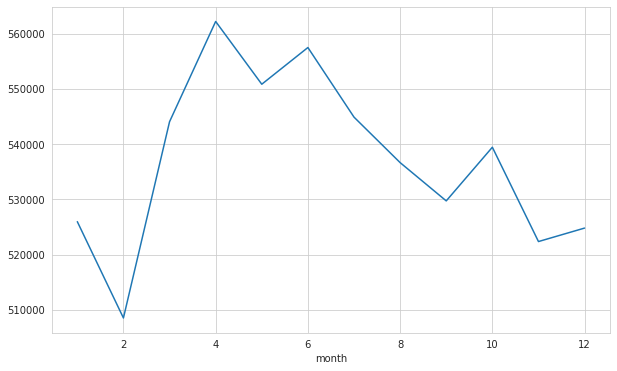

In [36]:
df.groupby('month')['price'].mean().plot();

In [37]:
df.shape

(21596, 21)

In [38]:
month_dummy = pd.get_dummies(df["month"], prefix = "month")
df = pd.concat([df, month_dummy], axis = 1)
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10,0,0,0,0,0,0,0,0,0,1,0,0
1,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12,0,0,0,0,0,0,0,0,0,0,0,1
2,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2,0,1,0,0,0,0,0,0,0,0,0,0
3,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12,0,0,0,0,0,0,0,0,0,0,0,1
4,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2,0,1,0,0,0,0,0,0,0,0,0,0


In [39]:
df = df.drop(["year" , "month"], axis = 1)

### zipcode

In [40]:
df['zipcode'].value_counts(dropna = False)

98103    601
98038    589
98115    583
98052    574
98117    553
        ... 
98102    104
98010    100
98024     80
98148     57
98039     50
Name: zipcode, Length: 70, dtype: int64

We can categorize the zipcodes as north, south, west, east, middle by regions. But it can be made manually and taken many time and we need domain knowladge to do that. So we will drop this column.

In [41]:
df = df.drop('zipcode', axis = 1)

### yr_renovated & yr_built

In [42]:
df['yr_renovated'].value_counts(dropna = False)

0       20682
2014       91
2013       37
2003       36
2005       35
        ...  
1951        1
1959        1
1948        1
1954        1
1944        1
Name: yr_renovated, Length: 70, dtype: int64

In [43]:
df['yr_built'].value_counts(dropna = False)

2014    559
2006    453
2005    450
2004    433
2003    420
       ... 
1933     30
1901     29
1902     27
1935     24
1934     21
Name: yr_built, Length: 116, dtype: int64

Could make sense due to scaling, higher should correlate to more value

### sqft_basement

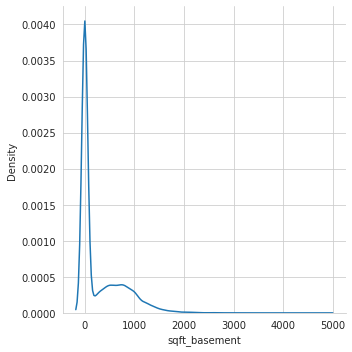

In [44]:
sns.displot(df['sqft_basement'] , kind = 'kde');

In [45]:
df['sqft_basement'].value_counts(dropna = False)

0      13110
600      221
700      218
500      214
800      206
       ...  
518        1
374        1
784        1
906        1
248        1
Name: sqft_basement, Length: 306, dtype: int64

In [46]:
df[df["sqft_basement"] > 3000].sort_values(by="sqft_basement", ascending=False)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
8085,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,1983,2009,47.557,-122.210,3270,10454,0,0,0,0,0,1,0,0,0,0,0,0
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,1999,0,47.667,-121.986,4850,217800,0,0,0,0,1,0,0,0,0,0,0,0
15468,3200000.000,4,3.250,7000,28206,1.000,1,4,4,12,3500,3500,1991,0,47.593,-122.086,4913,14663,0,0,0,0,0,0,0,1,0,0,0,0
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,47.630,-122.323,3940,8800,0,0,0,0,0,0,0,0,0,1,0,0
10074,1900000.000,5,4.250,6510,16471,2.000,0,3,4,11,3250,3260,1980,0,47.576,-122.242,4480,16471,0,0,0,0,0,0,0,0,1,0,0,0


Could make sense due to scaling, higher should correlate to more value

### sqft_above

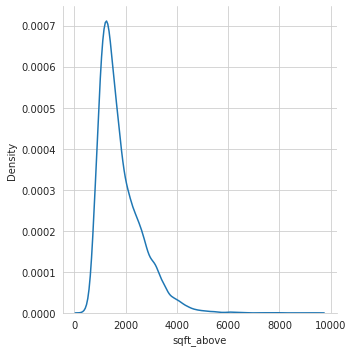

In [47]:
sns.displot(df['sqft_above'] , kind='kde');

In [48]:
df['sqft_above'].value_counts(dropna = False)

1300    212
1010    210
1200    206
1220    192
1140    184
       ... 
3674      1
2979      1
2382      1
6290      1
1425      1
Name: sqft_above, Length: 942, dtype: int64

In [49]:
df[df["sqft_above"] > 6000].sort_values(by="sqft_above", ascending=False)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,1999,0,47.667,-121.986,4850,217800,0,0,0,0,1,0,0,0,0,0,0,0
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,47.630,-122.240,4540,42730,0,0,0,0,0,0,0,0,1,0,0,0
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,47.630,-122.323,3940,8800,0,0,0,0,0,0,0,0,0,1,0,0
18288,3300000.000,5,6.250,8020,21738,2.000,0,0,3,11,8020,0,2001,0,47.568,-122.189,4160,18969,0,0,0,0,0,0,1,0,0,0,0,0
13398,2420000.000,5,4.750,7880,24250,2.000,0,2,3,13,7880,0,1996,0,47.733,-122.362,2740,10761,1,0,0,0,0,0,0,0,0,0,0,0
19842,2700000.000,4,4.000,7850,89651,2.000,0,0,3,12,7850,0,2006,0,47.541,-121.982,6210,95832,1,0,0,0,0,0,0,0,0,0,0,0
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,47.650,-122.214,3930,25449,0,0,0,0,0,1,0,0,0,0,0,0
11859,1950000.000,4,3.250,7420,167869,2.000,0,3,3,12,7420,0,2002,0,47.455,-121.764,5610,169549,1,0,0,0,0,0,0,0,0,0,0,0
18579,1140000.000,5,4.000,7320,217800,2.000,0,0,3,11,7320,0,1992,0,47.447,-122.086,3270,34500,0,0,0,0,0,0,1,0,0,0,0,0
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,47.623,-122.220,4600,21750,0,0,0,1,0,0,0,0,0,0,0,0


### Geographical Properties

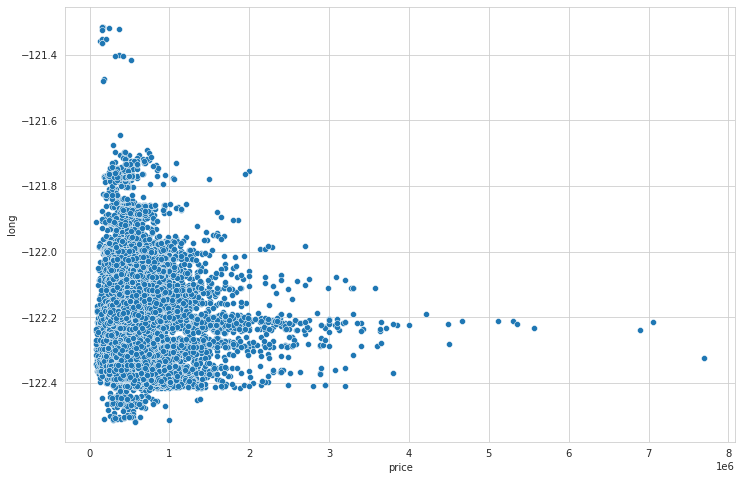

In [50]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'price', y = 'long', data = df);

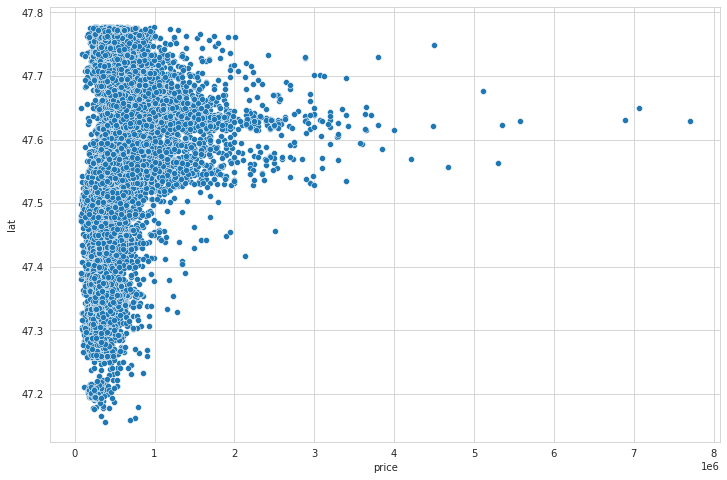

In [51]:
plt.figure(figsize  = (12, 8))
sns.scatterplot(x = 'price', y = 'lat', data = df);

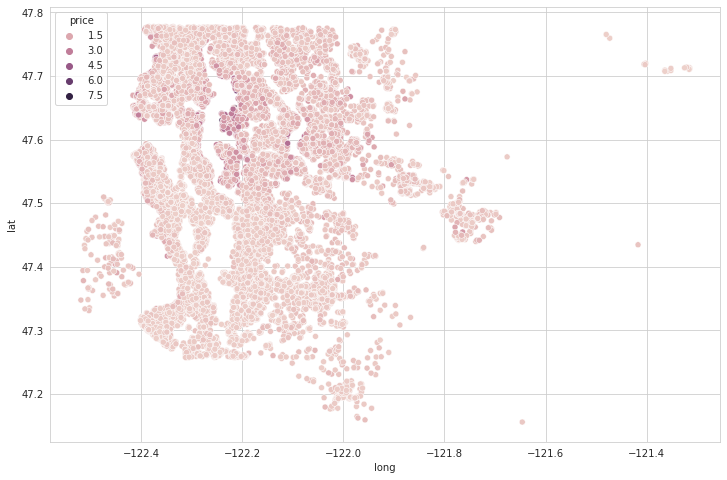

In [52]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = df, hue = 'price');

In [53]:
df.shape[0] * 0.01 # len(df) * (0.01)

215.96

In [54]:
df.sort_values('price' , ascending=False).head(216)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,47.630,-122.323,3940,8800,0,0,0,0,0,0,0,0,0,1,0,0
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,47.650,-122.214,3930,25449,0,0,0,0,0,1,0,0,0,0,0,0
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,47.630,-122.240,4540,42730,0,0,0,0,0,0,0,0,1,0,0,0
4407,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,47.629,-122.233,3560,24345,0,0,0,0,0,0,0,1,0,0,0,0
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,47.623,-122.220,4600,21750,0,0,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7408,1980000.000,6,4.500,4800,9097,2.000,0,0,3,10,3580,1220,2007,0,47.626,-122.291,2180,6037,0,0,0,0,0,0,1,0,0,0,0,0
16511,1980000.000,4,3.500,4500,44384,1.000,0,0,3,12,3340,1160,1990,0,47.632,-122.192,2540,26287,0,1,0,0,0,0,0,0,0,0,0,0
19513,1980000.000,4,4.000,4360,12081,2.000,0,0,3,10,4360,0,2007,0,47.638,-122.219,2180,10800,0,0,0,0,0,0,0,1,0,0,0,0
3278,1970000.000,5,3.750,3940,13738,1.500,0,3,4,9,3940,0,1951,0,47.620,-122.212,2370,13320,0,1,0,0,0,0,0,0,0,0,0,0


In [55]:
non_top_1_perc = df.sort_values('price' , ascending=False).iloc[:216,:]
# df.drop(df.sort_values('price' , ascending=False).head(216).index , inplace = True)
non_top_1_perc

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,47.630,-122.323,3940,8800,0,0,0,0,0,0,0,0,0,1,0,0
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,47.650,-122.214,3930,25449,0,0,0,0,0,1,0,0,0,0,0,0
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,47.630,-122.240,4540,42730,0,0,0,0,0,0,0,0,1,0,0,0
4407,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,47.629,-122.233,3560,24345,0,0,0,0,0,0,0,1,0,0,0,0
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,47.623,-122.220,4600,21750,0,0,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7408,1980000.000,6,4.500,4800,9097,2.000,0,0,3,10,3580,1220,2007,0,47.626,-122.291,2180,6037,0,0,0,0,0,0,1,0,0,0,0,0
16511,1980000.000,4,3.500,4500,44384,1.000,0,0,3,12,3340,1160,1990,0,47.632,-122.192,2540,26287,0,1,0,0,0,0,0,0,0,0,0,0
19513,1980000.000,4,4.000,4360,12081,2.000,0,0,3,10,4360,0,2007,0,47.638,-122.219,2180,10800,0,0,0,0,0,0,0,1,0,0,0,0
3278,1970000.000,5,3.750,3940,13738,1.500,0,3,4,9,3940,0,1951,0,47.620,-122.212,2370,13320,0,1,0,0,0,0,0,0,0,0,0,0


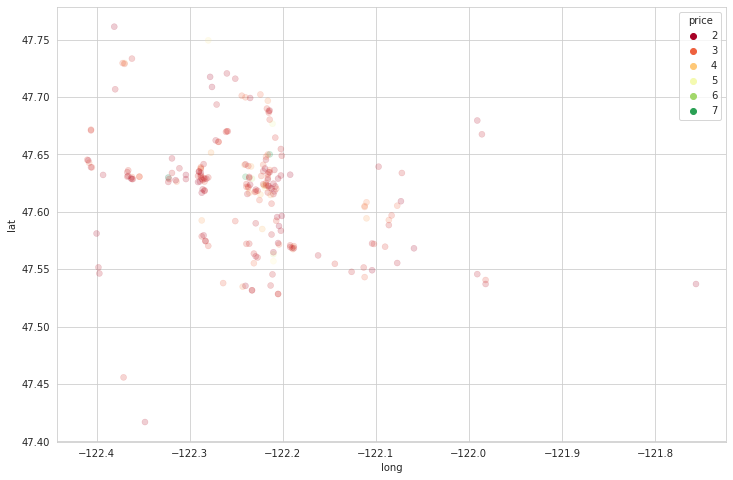

In [56]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = non_top_1_perc, hue = 'price',
                palette = 'RdYlGn', edgecolor = None, alpha = 0.2);

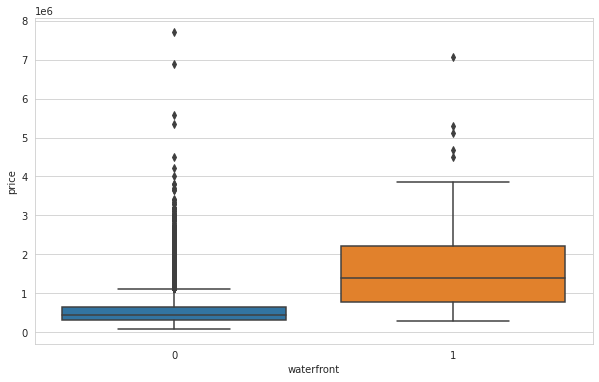

In [57]:
sns.boxplot(x = 'waterfront', y = 'price', data = df);

In [58]:
!pip install folium

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [59]:
import folium
import branca.colormap as cm

In [60]:
folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start=10)

In [61]:
step_1 = df.price.min() # min
step_2 = df.price.quantile(0.25) # q1
step_3 = df.price.quantile(0.50) # q2
step_4 = df.price.quantile(0.75) # q3 
step_5 = df.price.max() # max

In [62]:
m = folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start = 10)
colormap = cm.StepColormap(colors=["green","yellow","orange","red"] ,
                           index=[step_1, step_2, step_3, step_4, step_5],
                           vmin=step_1,
                           vmax=step_5)
for loc, p in zip(zip(df['lat'], df['long']),df["price"]):
      folium.Circle(
      location=loc,
      radius=1, 
      fill=True, 
      color=colormap(p)
      ).add_to(m)
m

## Final Data

In [63]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,47.511,-122.257,1340,5650,0,0,0,0,0,0,0,0,0,1,0,0
1,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,47.721,-122.319,1690,7639,0,0,0,0,0,0,0,0,0,0,0,1
2,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,47.738,-122.233,2720,8062,0,1,0,0,0,0,0,0,0,0,0,0
3,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,47.521,-122.393,1360,5000,0,0,0,0,0,0,0,0,0,0,0,1
4,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,47.617,-122.045,1800,7503,0,1,0,0,0,0,0,0,0,0,0,0


In [64]:
df.shape

(21596, 30)

## Preprocessing of Data
- Train | Test Split, Scalling

In [65]:
from sklearn.model_selection import train_test_split

In [66]:
X = df.drop('price' , axis = 1).values
y = df['price'].values

In [67]:
seed = 53

In [68]:
X_train , X_test , y_train , y_test = train_test_split(X , y , test_size = 0.1 , random_state = seed)

In [69]:
from sklearn.preprocessing import MinMaxScaler  # RobustScaler()

# If there are too many outliers in the data, robust scaler should be used, otherwise minmax can be used.

In [70]:
scaler = MinMaxScaler().fit(X_train , y_train)

In [71]:
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

## Modelling & Model Performance

In [72]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense , Activation

In [73]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score , explained_variance_score

In [74]:
def eval_metric(actual, pred):
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    score = r2_score(actual, pred)
    return print("r2_score:", score, "\nmae:", mae, "\nmse:", mse, "\nrmse:", rmse)

In [75]:
X_train_scaled.shape

(19436, 29)

In [76]:
X_test_scaled.shape

(2160, 29)

In [77]:
# 1.Model

In [78]:
tf.random.set_seed(seed)

model = Sequential()
model.add(Dense(29 , activation = 'relu'))

# model.add(Activation("relu")) # Activation function can be added separately as a different line after each layer. But not cool.
model.add(Dense(32 , activation = 'relu'))
model.add(Dense(32, activation = 'relu'))
model.add(Dense(32, activation = 'relu'))
model.add(Dense(32, activation = 'relu'))

model.add(Dense(1))

model.compile(optimizer = 'adam' , loss = 'mse')

In [79]:
model.fit(x = X_train_scaled, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 600)

Epoch 1/600
130/130 [==============================] - 3s 4ms/step - loss: 419783049216.0000 - val_loss: 431342944256.0000
Epoch 2/600
130/130 [==============================] - 0s 3ms/step - loss: 243433521152.0000 - val_loss: 107277803520.0000
Epoch 3/600
130/130 [==============================] - 0s 3ms/step - loss: 91922776064.0000 - val_loss: 100870414336.0000
Epoch 4/600
130/130 [==============================] - 0s 3ms/step - loss: 86405062656.0000 - val_loss: 94481850368.0000
Epoch 5/600
130/130 [==============================] - 0s 3ms/step - loss: 80569131008.0000 - val_loss: 87878893568.0000
Epoch 6/600
130/130 [==============================] - 0s 3ms/step - loss: 74251231232.0000 - val_loss: 80178806784.0000
Epoch 7/600
130/130 [==============================] - 0s 3ms/step - loss: 67115880448.0000 - val_loss: 72075264000.0000
Epoch 8/600
130/130 [==============================] - 0s 3ms/step - loss: 59863625728.0000 - val_loss: 64458194944.0000
Epoch 9/600
130/130 [======

In [80]:
loss_df = pd.DataFrame(model.history.history)
loss_df

,loss,val_loss
0,419783049216.000,431342944256.000
1,243433521152.000,107277803520.000
2,91922776064.000,100870414336.000
3,86405062656.000,94481850368.000
4,80569131008.000,87878893568.000
...,...,...
595,13432452096.000,31459815424.000
596,13337999360.000,30858225664.000
597,13344353280.000,30990972928.000
598,13380556800.000,31485808640.000


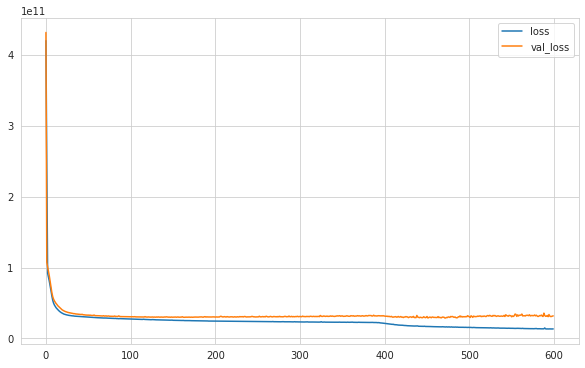

In [81]:
loss_df.plot();

In [82]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 29)                870       
                                                                 
 dense_1 (Dense)             (None, 32)                960       
                                                                 
 dense_2 (Dense)             (None, 32)                1056      
                                                                 
 dense_3 (Dense)             (None, 32)                1056      
                                                                 
 dense_4 (Dense)             (None, 32)                1056      
                                                                 
 dense_5 (Dense)             (None, 1)                 33        
                                                                 
Total params: 5,031
Trainable params: 5,031
Non-trainabl

In [83]:
model.evaluate(X_test_scaled, y_test, verbose=0)

24719874048.0

In [84]:
y_pred = model.predict(X_test_scaled)

68/68 [==============================] - 0s 1ms/step


In [85]:
eval_metric(y_test, y_pred)

r2_score: 0.8416082012792422 
mae: 84275.52643229166 
mse: 24719872739.949177 
rmse: 157225.5473514059


### learning_rate

In [86]:
from tensorflow.keras.optimizers import Adam

In [87]:
# 2.Model

In [88]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(29, activation = 'relu'))

model.add(Dense(32, activation = 'relu'))
model.add(Dense(32, activation = 'relu'))
model.add(Dense(32, activation = 'relu'))
model.add(Dense(32, activation = 'relu'))

model.add(Dense(1))

opt = Adam(learning_rate = 0.003) # default learning rate value was 0.001
model.compile(optimizer = opt, loss = 'mse')

In [89]:
model.fit(X_train_scaled , y_train , validation_split = 0.15 , batch_size = 128 , epochs = 600)

Epoch 1/600
130/130 [==============================] - 1s 4ms/step - loss: 310837182464.0000 - val_loss: 107806728192.0000
Epoch 2/600
130/130 [==============================] - 0s 3ms/step - loss: 84392009728.0000 - val_loss: 83684573184.0000
Epoch 3/600
130/130 [==============================] - 0s 3ms/step - loss: 63290290176.0000 - val_loss: 60657045504.0000
Epoch 4/600
130/130 [==============================] - 0s 3ms/step - loss: 48782352384.0000 - val_loss: 52374704128.0000
Epoch 5/600
130/130 [==============================] - 0s 3ms/step - loss: 43625308160.0000 - val_loss: 48768282624.0000
Epoch 6/600
130/130 [==============================] - 0s 3ms/step - loss: 41122156544.0000 - val_loss: 45750394880.0000
Epoch 7/600
130/130 [==============================] - 0s 3ms/step - loss: 39084195840.0000 - val_loss: 43984560128.0000
Epoch 8/600
130/130 [==============================] - 0s 3ms/step - loss: 37649264640.0000 - val_loss: 42071773184.0000
Epoch 9/600
130/130 [=========

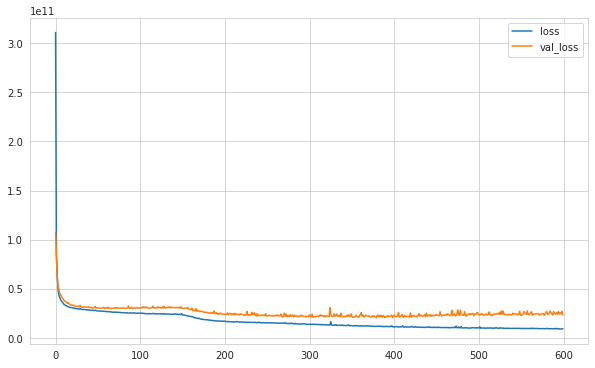

In [90]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [91]:
y_pred = model.predict(X_test_scaled)

68/68 [==============================] - 0s 1ms/step


In [92]:
eval_metric(y_test, y_pred)

r2_score: 0.8767479606129414 
mae: 77041.33547092014 
mse: 19235684885.16698 
rmse: 138692.77156783256


In [93]:
# 3.Model

In [94]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(29, activation = 'relu'))

model.add(Dense(32, activation = 'relu'))
model.add(Dense(32, activation = 'relu'))
model.add(Dense(32, activation = 'relu'))
model.add(Dense(32, activation = 'relu'))

model.add(Dense(1))

opt = Adam(learning_rate = 0.005) # default learning rate value was 0.001
model.compile(optimizer = opt, loss = 'mse')

In [95]:
model.fit(X_train_scaled , y_train , validation_split = 0.15 , batch_size = 128 , epochs = 600)

Epoch 1/600
130/130 [==============================] - 1s 4ms/step - loss: 248073322496.0000 - val_loss: 98436136960.0000
Epoch 2/600
130/130 [==============================] - 0s 3ms/step - loss: 75406024704.0000 - val_loss: 72029716480.0000
Epoch 3/600
130/130 [==============================] - 0s 3ms/step - loss: 53931991040.0000 - val_loss: 54588030976.0000
Epoch 4/600
130/130 [==============================] - 0s 3ms/step - loss: 43660529664.0000 - val_loss: 46439096320.0000
Epoch 5/600
130/130 [==============================] - 0s 3ms/step - loss: 38539485184.0000 - val_loss: 41945518080.0000
Epoch 6/600
130/130 [==============================] - 0s 3ms/step - loss: 35827027968.0000 - val_loss: 38539730944.0000
Epoch 7/600
130/130 [==============================] - 0s 3ms/step - loss: 33826134016.0000 - val_loss: 36835569664.0000
Epoch 8/600
130/130 [==============================] - 0s 3ms/step - loss: 32916211712.0000 - val_loss: 35840856064.0000
Epoch 9/600
130/130 [==========

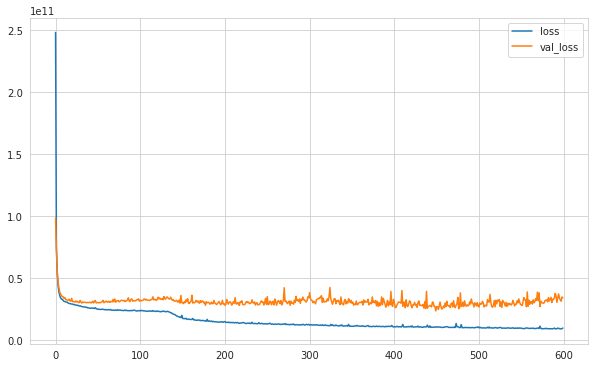

In [96]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [97]:
eval_metric(y_test, y_pred)

r2_score: 0.8767479606129414 
mae: 77041.33547092014 
mse: 19235684885.16698 
rmse: 138692.77156783256


### EarlyStopping

In [98]:
from tensorflow.keras.callbacks import EarlyStopping

In [99]:
# 4.Model

In [100]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(29, activation = 'relu'))

model.add(Dense(32, activation = 'relu'))
model.add(Dense(32, activation = 'relu'))
model.add(Dense(32, activation = 'relu'))
model.add(Dense(32, activation = 'relu'))

model.add(Dense(1))

opt = Adam(learning_rate = 0.005) 
model.compile(optimizer = opt, loss = 'mse')

In [101]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 80)

In [102]:
model.fit(X_train_scaled, y_train, validation_split = 0.15, batch_size = 128, epochs = 600, callbacks = [early_stop])

Epoch 1/600
130/130 [==============================] - 1s 4ms/step - loss: 248073322496.0000 - val_loss: 98436136960.0000
Epoch 2/600
130/130 [==============================] - 0s 3ms/step - loss: 75406024704.0000 - val_loss: 72029716480.0000
Epoch 3/600
130/130 [==============================] - 0s 3ms/step - loss: 53931986944.0000 - val_loss: 54588030976.0000
Epoch 4/600
130/130 [==============================] - 0s 3ms/step - loss: 43660529664.0000 - val_loss: 46439096320.0000
Epoch 5/600
130/130 [==============================] - 0s 3ms/step - loss: 38539485184.0000 - val_loss: 41945513984.0000
Epoch 6/600
130/130 [==============================] - 0s 3ms/step - loss: 35827032064.0000 - val_loss: 38539726848.0000
Epoch 7/600
130/130 [==============================] - 0s 3ms/step - loss: 33826134016.0000 - val_loss: 36835573760.0000
Epoch 8/600
130/130 [==============================] - 0s 3ms/step - loss: 32916215808.0000 - val_loss: 35840851968.0000
Epoch 9/600
130/130 [==========

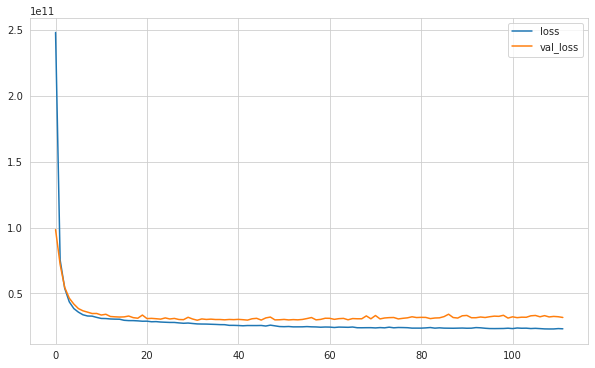

In [103]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [104]:
y_pred = model.predict(X_test_scaled)

68/68 [==============================] - 0s 1ms/step


In [105]:
eval_metric(y_test, y_pred)

r2_score: 0.8006602392022195 
mae: 103485.10486111112 
mse: 31110534501.981495 
rmse: 176381.78619682218


## Saving Final Model and Scaler

In [106]:
import joblib

In [107]:
scaler = MinMaxScaler().fit(X)

In [108]:
X_scaled = scaler.transform(X)

In [109]:
joblib.dump(scaler , 'scaler_house.joblib')

['scaler_house.joblib']

In [110]:
X_train_scaled , X_test_scaled , y_train , y_test = train_test_split(X_scaled , y , test_size = 0.15 , random_state = seed)

In [111]:
# 5. Model

In [112]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(29, activation = 'relu'))

model.add(Dense(32, activation = 'relu'))
model.add(Dense(32, activation = 'relu'))
model.add(Dense(32, activation = 'relu'))
model.add(Dense(32, activation = 'relu'))


model.add(Dense(1))

opt = Adam(learning_rate = 0.005)
model.compile(optimizer = opt, loss = 'mse')

In [113]:
# early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 50)

In [114]:
model.fit(x = X_train_scaled, y = y_train, validation_data = (X_test_scaled, y_test), batch_size = 128, epochs = 600,
         # callbacks = [early_stop]
         )

# model.fit(x = X_train_scaled, y = y_train, validation_split = 0.15 , batch_size = 128, epochs = 1000,
#          # callbacks = [early_stop]
#          )

Epoch 1/600
144/144 [==============================] - 1s 4ms/step - loss: 234698358784.0000 - val_loss: 96781950976.0000
Epoch 2/600
144/144 [==============================] - 0s 3ms/step - loss: 71642636288.0000 - val_loss: 65653846016.0000
Epoch 3/600
144/144 [==============================] - 0s 3ms/step - loss: 50203795456.0000 - val_loss: 51836465152.0000
Epoch 4/600
144/144 [==============================] - 0s 3ms/step - loss: 41338048512.0000 - val_loss: 44886065152.0000
Epoch 5/600
144/144 [==============================] - 0s 3ms/step - loss: 37324263424.0000 - val_loss: 40375316480.0000
Epoch 6/600
144/144 [==============================] - 0s 3ms/step - loss: 34463756288.0000 - val_loss: 38875201536.0000
Epoch 7/600
144/144 [==============================] - 0s 3ms/step - loss: 32976285696.0000 - val_loss: 37890981888.0000
Epoch 8/600
144/144 [==============================] - 0s 3ms/step - loss: 32316313600.0000 - val_loss: 36464263168.0000
Epoch 9/600
144/144 [==========

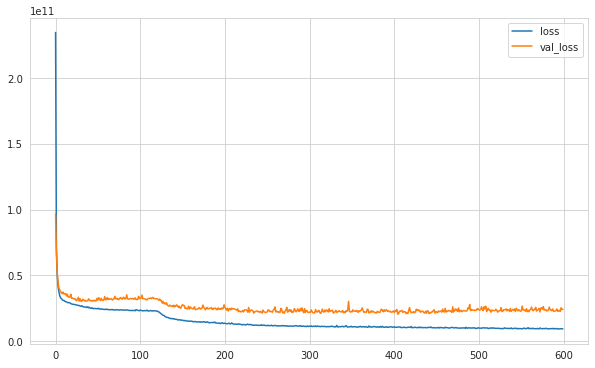

In [115]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [116]:
y_pred = model.predict(X_test_scaled)

102/102 [==============================] - 0s 1ms/step


In [117]:
eval_metric(y_test, y_pred)

r2_score: 0.8350396612528123 
mae: 76859.45978491512 
mse: 24236306104.61729 
rmse: 155680.14036677027


In [118]:
model.save('model_kc_house.h5')  # creates a D5 file 'my_model.h5'

## Loading Model and Scaler

In [119]:
from tensorflow.keras.models import load_model

In [120]:
model = load_model('model_kc_house.h5')
scaler = joblib.load("scaler_house.joblib")

## Prediction

In [121]:
single_house = df.drop('price', axis = 1).iloc[0:1, :]
single_house

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,47.511,-122.257,1340,5650,0,0,0,0,0,0,0,0,0,1,0,0


In [122]:
single_house = scaler.transform(single_house)
single_house

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:444: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


array([[0.2       , 0.06666667, 0.06150342, 0.00310751, 0.        ,
        0.        , 0.        , 0.5       , 0.4       , 0.08960177,
        0.        , 0.47826087, 0.        , 0.57149751, 0.21760797,
        0.16193426, 0.00574235, 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 1.        , 0.        , 0.        ]])

In [123]:
model.predict(single_house)

1/1 [==============================] - 0s 62ms/step


array([[243382.52]], dtype=float32)

In [124]:
df.iloc[0][0]

221900.0

## Comparison with ML

In [125]:
from sklearn.model_selection import GridSearchCV

### Linear Regression

In [126]:
from sklearn.linear_model import LinearRegression 

In [127]:
lr_model = LinearRegression().fit(X_train_scaled , y_train)
y_pred = lr_model.predict(X_test_scaled)
eval_metric(y_test , y_pred)

r2_score: 0.6842006931982925 
mae: 128806.8462962963 
mse: 46397871909.090126 
rmse: 215401.6525217254


In [128]:
# X_train_deg2 = PolynomialFeatures(degree = 2)

### Random Forest

In [129]:
from sklearn.ensemble import RandomForestRegressor

In [130]:
# rf_model = RandomForestRegressor(random_state = seed)
# rf_model = GridSearchCV(rf_model , param_grid = {'n_estimators' : [150,300,500,800] , 'max_depth' : [3,5,8,12,15] , 'max_features' : [2,3,5,8,15,'auto']}).fit(X_train_scaled , y_train)

In [131]:
# rf_model.best_params_

In [132]:
# rf_model.best_score_

In [133]:
rf_model = RandomForestRegressor(random_state = seed)
rf_model.fit(X_train_scaled, y_train)

RandomForestRegressor(random_state=53)

In [134]:
y_pred = rf_model.predict(X_test_scaled)
eval_metric(y_test, y_pred)

r2_score: 0.874108782232475 
mae: 71001.54681368312 
mse: 18496191950.556274 
rmse: 136000.7056987436


### LGBM

In [135]:
from lightgbm import LGBMRegressor

In [142]:
lgb_model = LGBMRegressor(random_state = seed)
lgb_model = GridSearchCV(lgb_model , param_grid = {'n_estimators' : [100,150,300,500,800] , 'learning_rate' : [0.01,0.03,0.05,0.08] , 'max_depth' : [2,3,5,8]} , cv = 5 , scoring = 'neg_root_mean_squared_error').fit(X_train_scaled , y_train)

In [143]:
lgb_model.best_params_

{'learning_rate': 0.08, 'max_depth': 5, 'n_estimators': 800}

In [144]:
lgb_model.best_score_

-122645.73038897508

In [145]:
y_pred = lgb_model.predict(X_test_scaled)
eval_metric(y_test, y_pred)

r2_score: 0.8946330541604773 
mae: 66573.52549972771 
mse: 15480724470.316586 
rmse: 124421.5595076536


In [138]:
# Done